<a href="https://colab.research.google.com/github/UrkoAlliBarrena/PRACTICA_TEMA5_Urko/blob/main/segmentacion_instancias.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Instance Segmentation** using YOLO11

In [1]:
# Este comando ejecuta la herramienta NVIDIA System Management Interface que muestra información
# sobre las tarjetas gráficas NVIDIA: modelo de la GPU, memoria utilizada y disponible, el uso
# de la GPU. Es decir, permite monitorizar el rendimiento y gestionar los recursos del sistema.

!nvidia-smi


Wed Dec  4 18:29:57 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.104.05             Driver Version: 535.104.05   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  Tesla T4                       Off | 00000000:00:04.0 Off |                    0 |
| N/A   41C    P8               9W /  70W |      0MiB / 15360MiB |      0%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

In [2]:
# Este comando instala las siguientes bibliotecas:
# - ultralytics: para modelos de detección de objetos (en este caso YOLO).
# - roboflow: para integrar datasets y visualización.
# - opencv-python: procesamiento de imágenes (aunque también puede procesar videos).
# - pandas: para manipular e datos estructurados.

!pip install ultralytics roboflow opencv-python pandas


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 898.5/898.5 kB 21.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 80.9/80.9 kB 4.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.8/66.8 kB 5.9 MB/s eta 0:00:00
  Attempting uninstall: idna
    Found existing installation: idna 3.10
    Uninstalling idna-3.10:
      Successfully uninstalled idna-3.10


Carga de datos desde Roboflow

In [3]:
# Para crear el siguiente código vamos a:
#   https://universe.roboflow.com/deepfake-umw80/bone-cancer-segmentation-xukmn
#     Download Project --> Download Dataset --> Forma YOLOV11 + Show download code --> Copiamos el código


# Se utiliza la API de Roboflow para descargar un conjunto de datos. Primero se instala el paquete
# roboflow, y se importa la clase Roboflow. Se verifica el acceso y se accede al conjunto de
# datos, y se descarga el conjunto de datos almacenándolo en la variable dataset, en formato YOLOV11.

!pip install roboflow
from roboflow import Roboflow
rf = Roboflow(api_key="OFT2Lac4SeKGqGndTwkz")
project = rf.workspace("deepfake-umw80").project("bone-cancer-segmentation-xukmn")
version = project.version(1)
dataset = version.download("yolov11")



loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to BONE-CANCER-SEGMENTATION-1 in yolov11:: 100%|██████████| 3874/3874 [00:01<00:00, 3662.71it/s]


In [4]:
# Importación del modelo YOLO y os para manejar las rutas
from ultralytics import YOLO
import os

# Ruta del archivo data.yaml con las configuraciones del dataset
data_yaml_path = os.path.join(dataset.location, 'data.yaml')

# Se inicializa un modelo preentrenado para segmentación
model = YOLO('yolo11n-seg.pt')

# Se entrena el modelo con distintos parámetros que determinan que se quiere realizar una segmentación,
# donde el modelo debe ser entrenado con la configuración del dataset que se encuentra en el archivo de
# la ruta data_yaml_path. Y este entrenamiento se realizará durante 10 iteraciones.

model.train(task='segment', mode='train', data=data_yaml_path, epochs=10)

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


100%|██████████| 5.90M/5.90M [00:00<00:00, 99.0MB/s]


Ultralytics 8.3.40 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=segment, mode=train, model=yolo11n-seg.pt, data=/content/BONE-CANCER-SEGMENTATION-1/data.yaml, epochs=10, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, sh

100%|██████████| 755k/755k [00:00<00:00, 23.0MB/s]


Overriding model.yaml nc=80 with nc=1

                   from  n    params  module                                       arguments                     
  0                  -1  1       464  ultralytics.nn.modules.conv.Conv             [3, 16, 3, 2]                 
  1                  -1  1      4672  ultralytics.nn.modules.conv.Conv             [16, 32, 3, 2]                
  2                  -1  1      6640  ultralytics.nn.modules.block.C3k2            [32, 64, 1, False, 0.25]      
  3                  -1  1     36992  ultralytics.nn.modules.conv.Conv             [64, 64, 3, 2]                
  4                  -1  1     26080  ultralytics.nn.modules.block.C3k2            [64, 128, 1, False, 0.25]     
  5                  -1  1    147712  ultralytics.nn.modules.conv.Conv             [128, 128, 3, 2]              
  6                  -1  1     87040  ultralytics.nn.modules.block.C3k2            [128, 128, 1, True]           
  7                  -1  1    295424  ultralytics

100%|██████████| 5.35M/5.35M [00:00<00:00, 104MB/s]


AMP: checks passed ✅


train: Scanning /content/BONE-CANCER-SEGMENTATION-1/train/labels... 1789 images, 0 backgrounds, 0 corrupt: 100%|██████████| 1789/1789 [00:01<00:00, 1509.52it/s]

train: New cache created: /content/BONE-CANCER-SEGMENTATION-1/train/labels.cache


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


A new version of Albumentations is available: 1.4.21 (you have 1.4.20). Upgrade using: pip install -U albumentations. To disable automatic update checks, set the environment variable NO_ALBUMENTATIONS_UPDATE to 1.
val: Scanning /content/BONE-CANCER-SEGMENTATION-1/valid/labels... 72 images, 1 backgrounds, 0 corrupt: 100%|██████████| 72/72 [00:00<00:00, 788.38it/s]

val: New cache created: /content/BONE-CANCER-SEGMENTATION-1/valid/labels.cache


Plotting labels to runs/segment/train/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.002, momentum=0.9) with parameter groups 90 weight(decay=0.0), 101 weight(decay=0.0005), 100 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to runs/segment/train
Starting training for 10 epochs...
Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       1/10      2.99G      1.937      3.572      3.868      2.181         18        640: 100%|██████████| 112/112 [00:49<00:00,  2.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.80it/s]

                   all         72         76       0.33     0.0789      0.106     0.0343      0.267      0.118     0.0805     0.0249



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       2/10      2.95G      2.147      3.555      3.329      2.366         15        640: 100%|██████████| 112/112 [00:41<00:00,  2.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.22it/s]

                   all         72         76     0.0799      0.316     0.0552     0.0154     0.0937      0.368     0.0684     0.0196



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       3/10      2.95G      2.117      3.464       2.95      2.345         17        640: 100%|██████████| 112/112 [00:42<00:00,  2.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.22it/s]

                   all         72         76      0.173      0.215      0.122      0.042       0.19      0.263      0.117     0.0426



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       4/10      2.94G      2.085      3.416       2.78      2.285         13        640: 100%|██████████| 112/112 [00:41<00:00,  2.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.43it/s]

                   all         72         76      0.213      0.303      0.198     0.0692       0.32      0.303      0.216     0.0773



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       5/10      2.94G      2.019      3.301      2.652       2.24         14        640: 100%|██████████| 112/112 [00:40<00:00,  2.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.58it/s]

                   all         72         76      0.218      0.329      0.194     0.0687      0.203      0.342        0.2     0.0775



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       6/10      2.94G      1.907      3.129      2.455      2.125         13        640: 100%|██████████| 112/112 [00:42<00:00,  2.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.68it/s]

                   all         72         76       0.39      0.329      0.335      0.135      0.396      0.368      0.321      0.128



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       7/10      2.94G      1.858      3.016      2.331      2.074         13        640: 100%|██████████| 112/112 [00:42<00:00,  2.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.79it/s]

                   all         72         76      0.514      0.329       0.37      0.144       0.52      0.342      0.347      0.143



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       8/10      2.94G      1.791      2.908      2.213      2.004         15        640: 100%|██████████| 112/112 [00:43<00:00,  2.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.61it/s]

                   all         72         76      0.364        0.5      0.429      0.185      0.405      0.487      0.433      0.166



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       9/10      2.94G      1.735      2.773      2.116      1.957         14        640: 100%|██████████| 112/112 [00:40<00:00,  2.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.77it/s]

                   all         72         76      0.429      0.474      0.366       0.15       0.48      0.526      0.403      0.153



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      10/10      2.94G      1.682      2.674      2.012      1.896         14        640: 100%|██████████| 112/112 [00:43<00:00,  2.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.37it/s]

                   all         72         76      0.527      0.513       0.49      0.206      0.613      0.579      0.554      0.206



10 epochs completed in 0.127 hours.
Optimizer stripped from runs/segment/train/weights/last.pt, 6.0MB
Optimizer stripped from runs/segment/train/weights/best.pt, 6.0MB

Validating runs/segment/train/weights/best.pt...
Ultralytics 8.3.40 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
YOLO11n-seg summary (fused): 265 layers, 2,834,763 parameters, 0 gradients, 10.2 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.93it/s]


                   all         72         76      0.527      0.513      0.491      0.206      0.642      0.579      0.554      0.206
Speed: 0.4ms preprocess, 3.6ms inference, 0.0ms loss, 3.6ms postprocess per image
Results saved to runs/segment/train


ultralytics.utils.metrics.SegmentMetrics object with attributes:

ap_class_index: array([0])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7f2ff8bac2e0>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)', 'Precision-Recall(M)', 'F1-Confidence(M)', 'Precision-Confidence(M)', 'Recall-Confidence(M)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041, 

In [5]:
# Se realiza la validación del modelo entrenado en la celda anterior con el conjunto de datos de
# validación, y se deuvelven datos sobre la precisión, sensibilidad, confianza...

metrics = model.val()

print("Model Evaluation Metrics:", metrics)

# Cabe destacar, que si no se le pasa ningún parámetro al método model.val(), la validación se realiza
# automáticamente sobre el conjunto de datos de validación definido en el archivo data.yaml en el
# proceso de entrenamiento.

Ultralytics 8.3.40 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
YOLO11n-seg summary (fused): 265 layers, 2,834,763 parameters, 0 gradients, 10.2 GFLOPs


val: Scanning /content/BONE-CANCER-SEGMENTATION-1/valid/labels.cache... 72 images, 1 backgrounds, 0 corrupt: 100%|██████████| 72/72 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:06<00:00,  1.23s/it]


                   all         72         76      0.529      0.513       0.49      0.206      0.612      0.579      0.554      0.206
Speed: 1.0ms preprocess, 25.6ms inference, 0.0ms loss, 10.5ms postprocess per image
Results saved to runs/segment/train2
Model Evaluation Metrics: ultralytics.utils.metrics.SegmentMetrics object with attributes:

ap_class_index: array([0])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7f2fffb68dc0>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)', 'Precision-Recall(M)', 'F1-Confidence(M)', 'Precision-Confidence(M)', 'Recall-Confidence(M)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002, 

In [6]:
# Mediante el siguiente código se puede exportar el modelo creado en formato ONNX. Se encuentra comentado
# ya que no me intersa exportarlo.

# model.export(format='onnx')


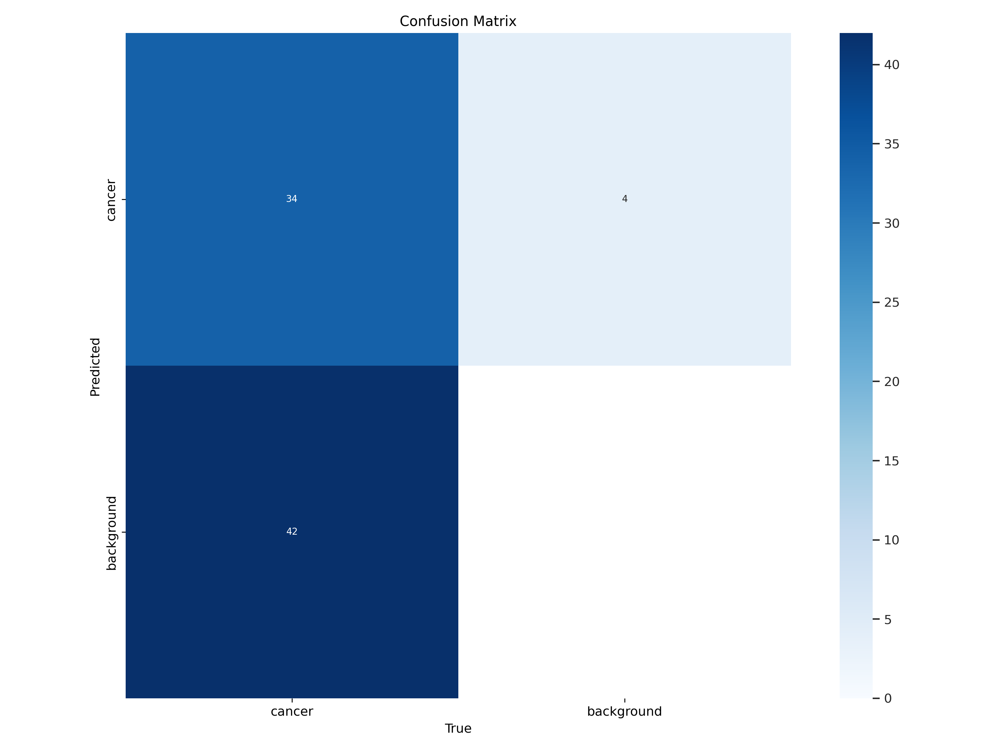

In [7]:
# Se muestra una imagen generada durante el entrenamiento del modelo YOLO. En este caso, la imagen
# representa la matriz de confusión generada en la segmentación.

from IPython.display import Image, display
display(Image('/content/runs/segment/train/confusion_matrix.png'))



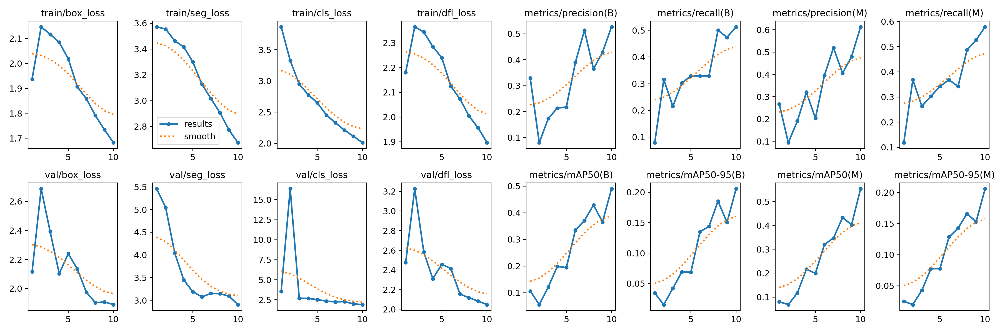

In [8]:
# El siguiente código permite mostrar los resultados tras realizar el entrenamiento de la segmentación.
display(Image('/content/runs/segment/train/results.png'))


In [9]:
# El siguiente código permite mostrar los resultados en forma de tabla que se encuentran guardados en un CSV,
# donde este CSV contiene los resultados de entrenamiendo del modelo YOLO.

import pandas as pd

csv_file_path = '/content/runs/segment/train/results.csv'
df = pd.read_csv(csv_file_path)

print(df)

   epoch      time  train/box_loss  train/seg_loss  train/cls_loss  \
0      1   59.0269         1.93722         3.57238         3.86807   
1      2  103.4200         2.14725         3.55482         3.32862   
2      3  148.2480         2.11699         3.46427         2.94951   
3      4  191.9300         2.08508         3.41581         2.77964   
4      5  234.3660         2.01877         3.30077         2.65156   
5      6  278.8610         1.90681         3.12858         2.45501   
6      7  323.4870         1.85837         3.01640         2.33122   
7      8  368.4460         1.79137         2.90751         2.21332   
8      9  410.6140         1.73457         2.77314         2.11560   
9     10  455.9960         1.68207         2.67437         2.01244   

   train/dfl_loss  metrics/precision(B)  metrics/recall(B)  metrics/mAP50(B)  \
0         2.18125               0.32966            0.07895           0.10639   
1         2.36562               0.07989            0.31579           

In [10]:
# En el siguiente código se importan las bibliotecas necesarias para procesar y visualizar imágenes, y se
# define la ruta de entrenamiento.
import cv2
from google.colab.patches import cv2_imshow
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

train_path = '/content/runs/segment/train'


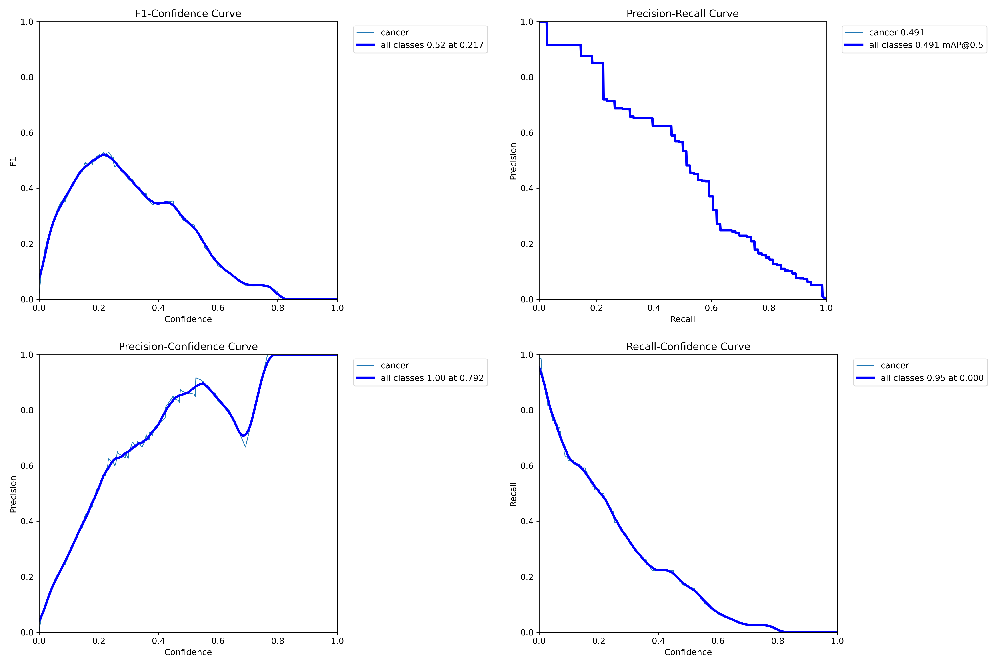

In [11]:
# Este código carga cuatro imágenes de curvas de rendimiento generadas durante el entrenamiento, donde
# las imágenes incluyen las curvas: F1-score, Precision-Recall, Precision y Recall. Después de cargar
# las imágenes, se concatenan para mostrar de una manera más visual los resultados..

# Se cargan las imáganes de las curvas que se quieren visualizar
img1 = cv2.imread(f'{train_path}/BoxF1_curve.png')
img2 = cv2.imread(f'{train_path}/BoxPR_curve.png')
img3 = cv2.imread(f'{train_path}/BoxP_curve.png')
img4 = cv2.imread(f'{train_path}/BoxR_curve.png')

# Concatenación de las imágenes de manera horizontal
top_row = cv2.hconcat([img1, img2])
bottom_row = cv2.hconcat([img3, img4])

# Concatenación de las imágenes de manera vertical
grid = cv2.vconcat([top_row, bottom_row])

# Visualización de las imágenes concatenadas
cv2_imshow(grid)


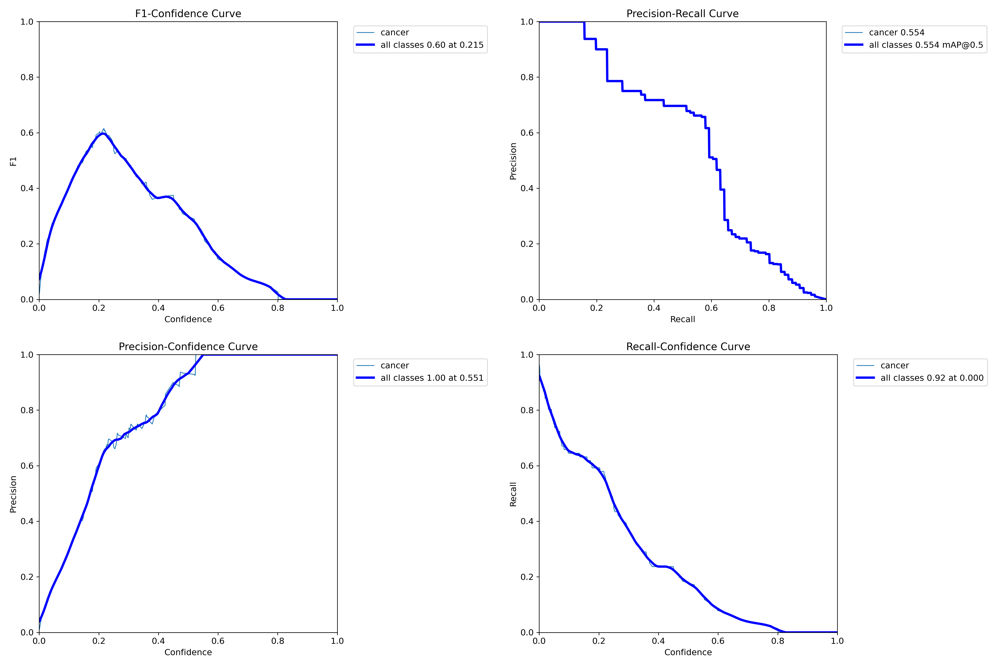

In [12]:
# Este código carga cuatro imágenes de curvas de rendimiento generadas durante el entrenamiento, donde
# las imágenes incluyen las curvas: F1-score, Precision-Recall, Precision y Recall. Después de cargar
# las imágenes, se concatenan para mostrar de una manera más visual los resultados..

# Se cargan las imáganes de las curvas que se quieren visualizar
img1 = cv2.imread(f'{train_path}/MaskF1_curve.png')
img2 = cv2.imread(f'{train_path}/MaskPR_curve.png')
img3 = cv2.imread(f'{train_path}/MaskP_curve.png')
img4 = cv2.imread(f'{train_path}/MaskR_curve.png')

# Concatenación de las imágenes de manera horizontal
top_row = cv2.hconcat([img1, img2])
bottom_row = cv2.hconcat([img3, img4])

# Concatenación de las imágenes de manera vertical
grid = cv2.vconcat([top_row, bottom_row])

# Visualización de las imágenes concatenadas
cv2_imshow(grid)


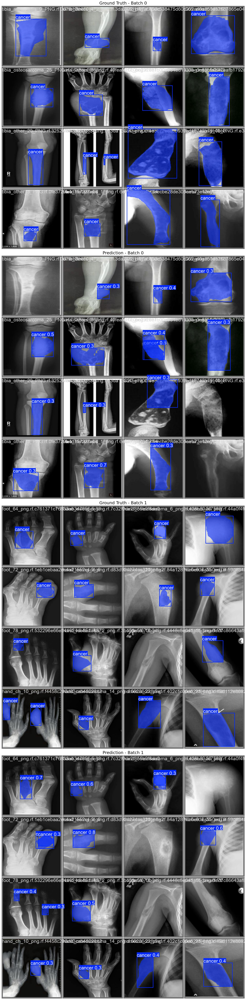

In [13]:
# El siguiente código permite visualizar los resultados de validación del modelo YOLO, mediante la
# visualización de las imágenes GROUNDTRUTH, y las correspondientes predicciones generadas por el modelo.

# Se cargan las imágenes
img1 = mpimg.imread(f'{train_path}/val_batch0_labels.jpg')
img2 = mpimg.imread(f'{train_path}/val_batch0_pred.jpg')
img3 = mpimg.imread(f'{train_path}/val_batch1_labels.jpg')
img4 = mpimg.imread(f'{train_path}/val_batch1_pred.jpg')

# Se obtienen las dimensiones de la primera imagen en este caso; ya que las demás imágenes contendrán
# exactamente las mismas dimensiones que esta.
img_height, img_width, _ = img1.shape

# Se crea una figura para mostrar las imágenes y se ajusta el tamaño de la figura para que se ajuste
# al tamaño de las imágenes
fig, axes = plt.subplots(4, 1, figsize=(img_width / 100, 4 * img_height / 100))

# Se referencian las imágenes en sus ejes con sus respectivos títulos
axes[0].imshow(img1)
axes[0].set_title("Ground Truth - Batch 0", fontsize=22)
axes[1].imshow(img2)
axes[1].set_title("Prediction - Batch 0", fontsize=22)
axes[2].imshow(img3)
axes[2].set_title("Ground Truth - Batch 1", fontsize=22)
axes[3].imshow(img4)
axes[3].set_title("Prediction - Batch 1", fontsize=22)

# Se eliminan los ejes de las imágenes
for ax in axes:
    ax.axis('off')

# Se ajusta el despliegue de las imágenes para evitar errores o solapamientos en la visualización
plt.tight_layout(rect=[0, 0, 1, 0.95])

# Se muestran las imágenes referenciadas previamente en sus correspondientes ejes
plt.show()


In [14]:
# Predict on test data using trained model

# Se cargan los mejores pesos obtenidos en el entrenamiento del modelo
model = YOLO('/content/runs/segment/train/weights/best.pt')

# En caso de ser necesario se cambia el directorio, y se define la ruta de las imágenes de prueba.
# %cd
test_path = '/content/BONE-CANCER-SEGMENTATION-1/test/images'

# Lista todos los archivos en la carpeta de test/prueba, mediante la generación de la ruta completa a
# cada uno de estos archivos y filtrando, para seleccionar sólo imagenes con extensiones: .jpg, .jpeg y .png.
image_files = [os.path.join(test_path, img) for img in os.listdir(test_path) if img.endswith(('.jpg', '.jpeg', '.png'))]

# Finalemente se realiza una predicción sobre la imagen almacenada en img_path mediante el modelo YOLO,
# donde se guardan las predicciones generadas, y se establece una confianza del 50%.
for img_path in image_files:
    results = model.predict(source=img_path, save=True, conf=0.50)



image 1/1 /content/BONE-CANCER-SEGMENTATION-1/test/images/C19_png.rf.d477f701c1f6eb4114640015796d6a27.jpg: 640x640 (no detections), 28.4ms
Speed: 7.3ms preprocess, 28.4ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)
Results saved to runs/segment/predict

image 1/1 /content/BONE-CANCER-SEGMENTATION-1/test/images/humerus_22_png.rf.b77f63894972680a44d71e642e2d582c.jpg: 640x640 (no detections), 18.2ms
Speed: 2.9ms preprocess, 18.2ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 640)
Results saved to runs/segment/predict

image 1/1 /content/BONE-CANCER-SEGMENTATION-1/test/images/hand_encondroma_11_png.rf.1843afa97ee4ca4f7b5817f7f781b59c.jpg: 640x640 (no detections), 17.2ms
Speed: 2.9ms preprocess, 17.2ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 640)
Results saved to runs/segment/predict

image 1/1 /content/BONE-CANCER-SEGMENTATION-1/test/images/tibia_ewing_16_PNG.rf.cc61a2199452cb2ca73198fa8f3e4440.jpg: 640x640 (no detections), 17.2ms
Sp

# This project is only for learning purpose
The accuracy of the model is very low because it has been trained over very few epochs.